# Making a synthetic model

## import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

sys.path.insert(1, "../")

# local python scripts
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.plotting as plots
import RIS_gravity_inversion.utils as inv_utils
import RIS_gravity_inversion.synthetic as synth

from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import numpy as np
import pandas as pd
import xarray as xr
import verde as vd
import scipy as sp
import rioxarray
import pygmt

# for plotting
import pvxarray
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.xarray
import hvplot.pandas

# hvplot.extension('bokeh', 'matplotlib', 'plotly')
import panel.widgets as pnw
import panel as pn

pn.extension(comms="vscode")

import os

PROJ: proj_create_from_database: Cannot find proj.db


# Set region and parameters

In [2]:
# set grid parameters
spacing = 1e3
registration = "g"

# same as RIS gravity inversion region
RIS_inv_region = [-580e3, 420e3, -1420e3, -420e3]

inversion_region, buffer_region = utils.alter_region(
    RIS_inv_region,
    zoom=350e3,
    n_shift=50e3,
    w_shift=0e3,
    buffer=50e3,
)

# bigger than starting to allow for resampling
outer_region = utils.alter_region(buffer_region, zoom=-10e3)[0]

print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)
print("outer region = ", outer_region)

inversion region =  [-230000.0, 70000.0, -1120000.0, -820000.0]
buffer region =  [-280000, 120000, -1170000, -770000]
outer region =  [-290000.0, 130000.0, -1180000.0, -760000.0]


# Create synthetic layers

## Vizualize Ross Ice Shelf data

Block-reduced the gravity data at 1000m spacing
from 81402 points to 7643 points

********************Resampling icebase layer ********************


c:\Users\matthewt\AppData\Local\miniforge3\envs\RIS_gravity_inversion\lib\site-packages\xarray\backends\plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


returning grid with new region and/or registration, same spacing
icebase info: (1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -494.685577393, -102.650985718, 'g')

********************Resampling bathymetry layer ********************
returning grid with new region and/or registration, same spacing
bathymetry info: (1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -810.191711426, -242.479827881, 'g')
gravity: 7643 points
gravity avg. elevation: 781
bathymetry control points:33
bathymetry control points within RIS:33


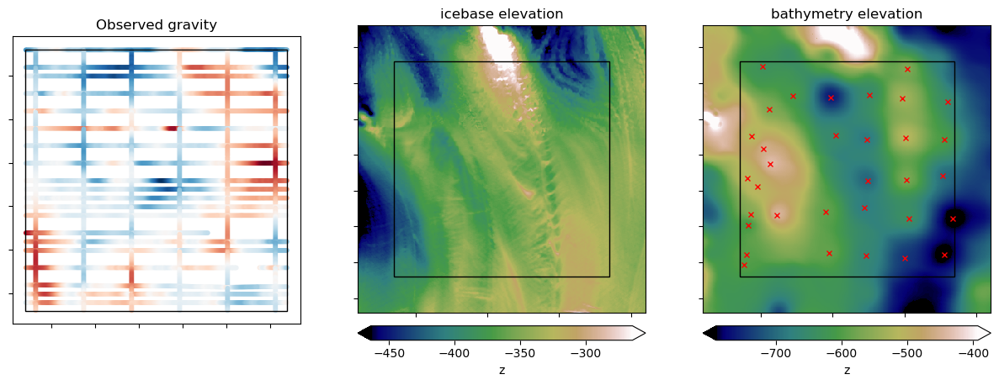

In [3]:
returned = inv_utils.import_layers(
    layers_list=["icebase", "bathymetry"],
    spacing_list=[spacing, spacing],
    rho_list=[2300, 2670],
    fname_list=[
        # ICEBASE
        "../inversion_layers/bedmap2_icebase.zarr",
        # BED/BATHYMETRY
        "../inversion_layers/bedmap2_bed.zarr",
    ],
    grav_spacing=spacing,
    active_layer="bathymetry",
    buffer_region=buffer_region,
    inversion_region=inversion_region,
    grav_file="../ross_ice_shelf_gravity_data.csv.gz",
    # kwargs
    block_reduction="pygmt",
    input_grav_name="free_air_anomaly",
    input_obs_height_name="ellipsoidal_elevation",
    constraint_points="../ross_ice_shelf_bed_data.csv.gz",
    shapefile="../plotting/RIS_outline.shp",
)
(
    layers,
    grav,
    constraint_grid,
    constraint_points,
    constraint_points_RIS,
) = returned

plots.plot_inputs(
    returned,
    grav_spacing=spacing,
    active_layer="bathymetry",
    # region = buffer_reg,
    inversion_region=inversion_region,
    # plot_type='pygmt', # 54 secs
    plot_type="xarray",  # 2.1 secs
    # kwargs
    # power_spectrum=True,
    plotting_constraints=constraint_points,
)

In [4]:
grid = layers["icebase"]["grid"]
grd1 = grid.hvplot(
    cmap="gist_earth",
    title="icebase",
    rasterize=True,
)  # .hist(num_bins=50)

kde1 = grid.hvplot.kde()

grid = layers["bathymetry"]["grid"]
grd2 = grid.hvplot(
    cmap="gist_earth",
    title="bed",
    rasterize=True,
)  # .hist(num_bins=50)

kde2 = grid.hvplot.kde()

fig3 = grav.hvplot.scatter(x="x", y="y", c="Gobs", cmap="RdBu_r", size=10)

# top = [grd1, grd2, fig3]
# bottom = [kde1+kde2]
# fig1+fig2+fig3

In [5]:
# hv.help(hv.Image)

Image

Online example: http://holoviews.org/reference/elements/bokeh/Image.html

-------------
Style Options
-------------

	alpha, cmap, muted, visible

(Consult bokeh's documentation for more information.)

------------
Plot Options
------------

The plot options are the parameters of the plotting class:

Parameters of 'RasterPlot'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                                       Value                         Type         Bounds     Mode  

fontsize                             {'title': '12pt'}                Parameter                V RW AN 
fontscale                                   None                        Number                 V RW AN 
show_title                                  True                       Boolean        (0, 1)     V RW  
title                          '{label} {group} {dimensions}'           Strin

In [6]:
hv.output(size=60)

In [7]:
from holoviews import dim, opts

layout = grd1 + grd2 + fig3

layout.opts(
    opts.Image(
        colorbar_position="bottom",
        data_aspect=1,
        colorbar_opts=dict(width=100),
        # frame_width=200,
        xaxis=None,
        yaxis=None,
    ),
    opts.Scatter(
        colorbar_position="bottom",
        data_aspect=1,
        colorbar_opts=dict(width=100),
        xaxis=None,
        yaxis=None,
    ),
)
# grd1 + grd2.opts(colorbar_position='left')

BokehModel(combine_events=True, render_bundle={'docs_json': {'74122caa-7750-4871-9de7-afbab44a2f00': {'defs': …

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (z)
   .Scatter.I     :Scatter   [x]   (y,Gobs)

In [8]:
# fig = (grd1.hist(num_bins=50) + grd2.hist(num_bins=50))

# opts.defaults(opts.Layout(fig_size=100))

# (grd1.hist(num_bins=50) + grd2.hist(num_bins=50)).opts(tight=True)
# fig.opts(tight=True)

In [9]:
# layout= (grd1 + grd2 + fig3 + kde1 + kde2).cols(3)

# layout.opts(
#     opts.
#     opts.Layout(shared_axes=False),
#     )

### get stats of layers

In [10]:
# mask out the mountains to focus on area of interest
icebase_masked = utils.mask_from_shp(
    "../plotting/RIS_outline.shp",
    invert=False,
    xr_grid=layers["icebase"]["grid"],
    masked=True,
)

bathymetry_masked = utils.mask_from_shp(
    "../plotting/RIS_outline.shp",
    invert=False,
    xr_grid=layers["bathymetry"]["grid"],
    masked=True,
)

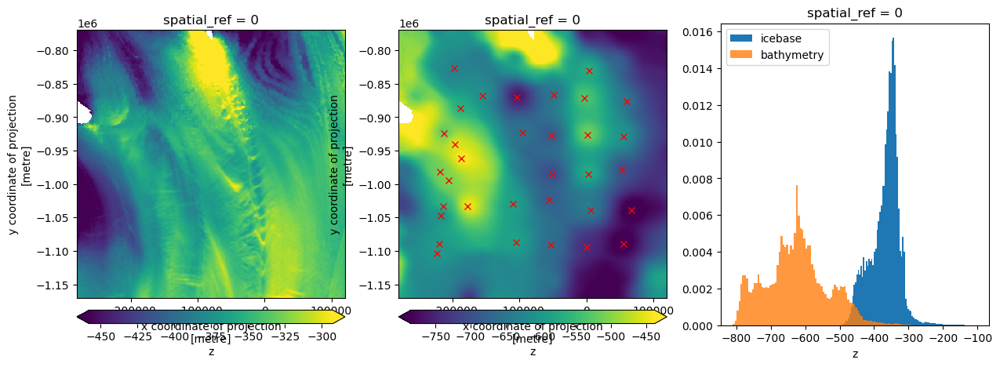

In [11]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(5 * 3, 5 * 1))

icebase_masked.plot(
    ax=axs[0],
    robust=True,
    cbar_kwargs={
        "orientation": "horizontal",
        "anchor": (1, 1),
        "fraction": 0.05,
        "pad": 0.04,
    },
)


bathymetry_masked.plot(
    ax=axs[1],
    robust=True,
    cbar_kwargs={
        "orientation": "horizontal",
        "anchor": (1, 1),
        "fraction": 0.05,
        "pad": 0.04,
    },
)

axs[1].plot(constraint_points_RIS.x, constraint_points_RIS.y, "rx")

bins = icebase_masked.plot.hist(ax=axs[2], bins=100, density=True, label="icebase")
bins = bathymetry_masked.plot.hist(
    ax=axs[2], bins=100, density=True, label="bathymetry", alpha=0.8
)
plt.legend()


axs[0].set_aspect("equal")
axs[1].set_aspect("equal")

In [12]:
mesh = bathymetry_masked.pyvista.mesh(x="x", y="y")

mesh.warp_by_scalar(factor=100,).plot(
    show_edges=False,
)

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

## Synthetic model
Here we'll construct a synthetic model, trying to roughly recreate the features seen in the Ross Ice Shelf region.

### flat upper layer
this will represent the ice base, which has an mean elevation of -350m

In [13]:
# create grid of coordinates
coords = vd.grid_coordinates(
    region=outer_region,
    spacing=spacing,
    pixel_register=False,
)

# create xarray dataarray from coordinates with a constant value of -350m
layer1 = vd.make_xarray_grid(
    coords, np.ones_like(coords[0]) * -350, data_names="z", dims=("y", "x")
).z

layer1 = fetch.resample_grid(
    layer1, spacing=spacing, region=buffer_region, registration=registration
)

utils.get_grid_info(layer1)

returning grid with new region and/or registration, same spacing


(1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -350.0, -350.0, 'g')

### bathymetry layer
bedmap2 bathymetry has a mean elevation of ~ -700m, we'll try to match our synthetic grid to that

returning grid with new region and/or registration, same spacing


(1000.0,
 [-280000.0, 120000.0, -1170000.0, -770000.0],
 -945.301879883,
 -435.387756348,
 'g')

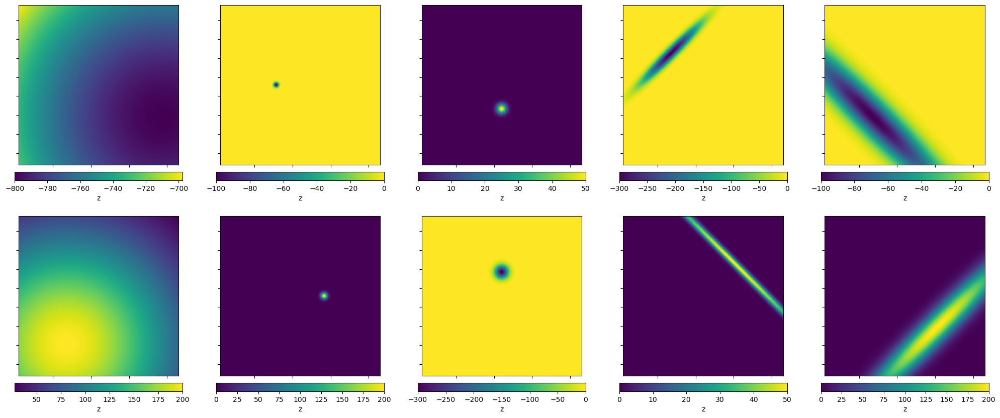

In [14]:
layer2 = synth.synthetic_topography(
    spacing,
    outer_region,
    plot_individuals=True,
    registration=registration,
)

layer2 = fetch.resample_grid(
    layer2, spacing=spacing, region=buffer_region, registration=registration
)

utils.get_grid_info(layer2)

In [15]:
df = vd.grid_to_table(layer2)
df["noise"] = synth.contaminate(
    df.z,
    stddev=10,
    percent=False,
    seed=0,
)
layer2_noise = df.set_index(["y", "x"]).to_xarray().noise

returning original grid
returning original grid


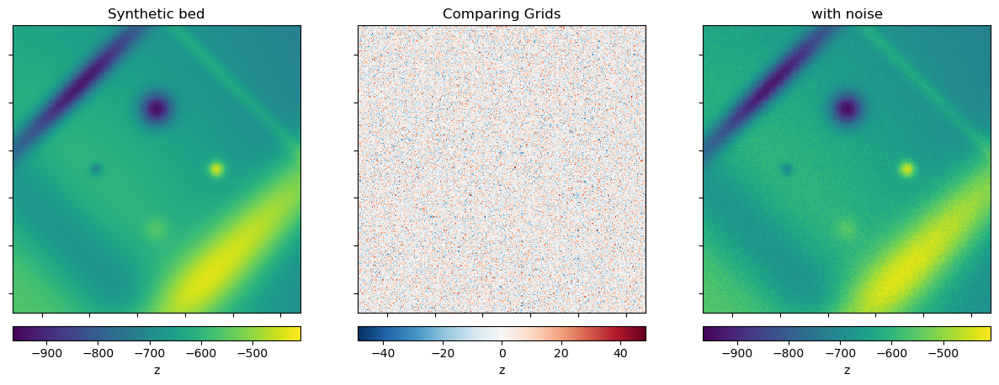

In [16]:
grids = utils.grd_compare(
    layer2,
    layer2_noise,
    plot=True,
    region=inversion_region,
    plot_type="xarray",
    grid1_name="Synthetic bed",
    grid2_name="with noise",
    show_region=inversion_region,
)

In [17]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=1,
    cols=2,
    specs=[[{"is_3d": True}, {"is_3d": True}]],
    subplot_titles=["Synthetic bed", "with noise"],
)

fig.add_trace(go.Surface(z=layer2.values), 1, 1)
fig.add_trace(go.Surface(z=layer2_noise.values), 1, 2)

fig.show()

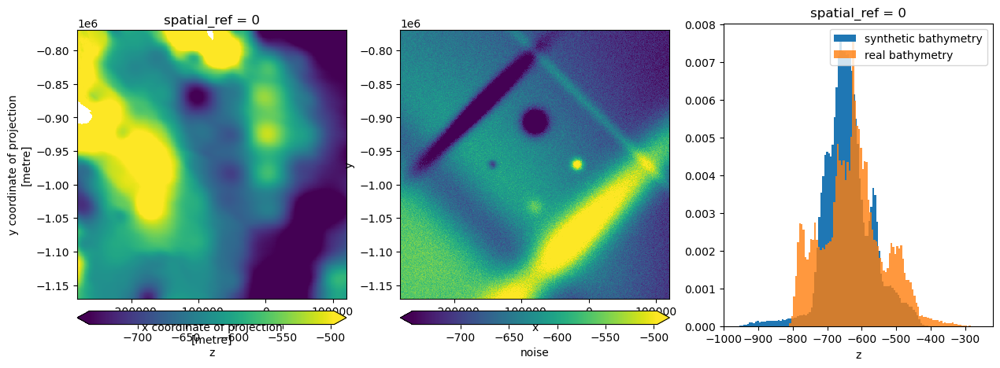

In [18]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(5 * 3, 5 * 1))

vmin, vmax = bathymetry_masked.quantile(0.1), bathymetry_masked.quantile(0.9)

bathymetry_masked.plot(
    ax=axs[0],
    vmin=vmin,
    vmax=vmax,
    cbar_kwargs={
        "orientation": "horizontal",
        "anchor": (1, 1),
        "fraction": 0.05,
        "pad": 0.04,
    },
)

layer2_noise.plot(
    ax=axs[1],
    vmin=vmin,
    vmax=vmax,
    cbar_kwargs={
        "orientation": "horizontal",
        "anchor": (1, 1),
        "fraction": 0.05,
        "pad": 0.04,
    },
)

bins = layer2_noise.plot.hist(
    ax=axs[2], bins=100, density=True, label="synthetic bathymetry"
)
bins = bathymetry_masked.plot.hist(
    ax=axs[2], bins=100, density=True, label="real bathymetry", alpha=0.8
)
plt.legend()


axs[0].set_aspect("equal")
axs[1].set_aspect("equal")

### base layer

returning grid with new region and/or registration, same spacing


(1000.0,
 [-280000.0, 120000.0, -1170000.0, -770000.0],
 -4641.64697266,
 -3293.51464844,
 'g')

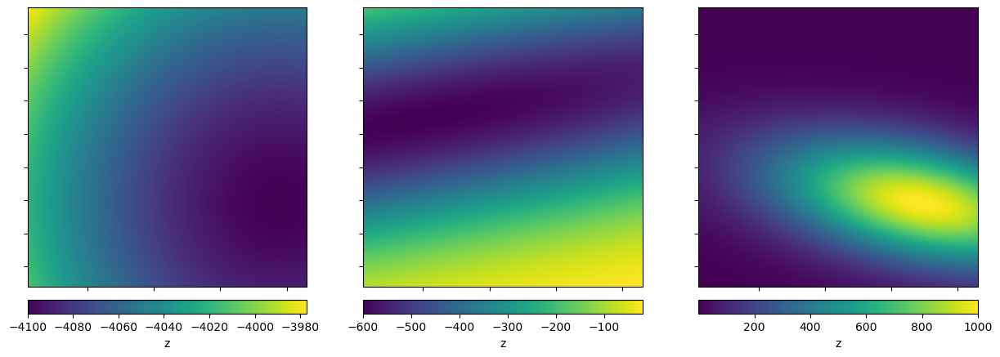

In [19]:
layer3 = synth.synthetic_topography_regional(
    spacing,
    outer_region,
    plot_individuals=True,
    registration=registration,
)

layer3 = fetch.resample_grid(
    layer3, spacing=spacing, region=buffer_region, registration=registration
)

utils.get_grid_info(layer3)

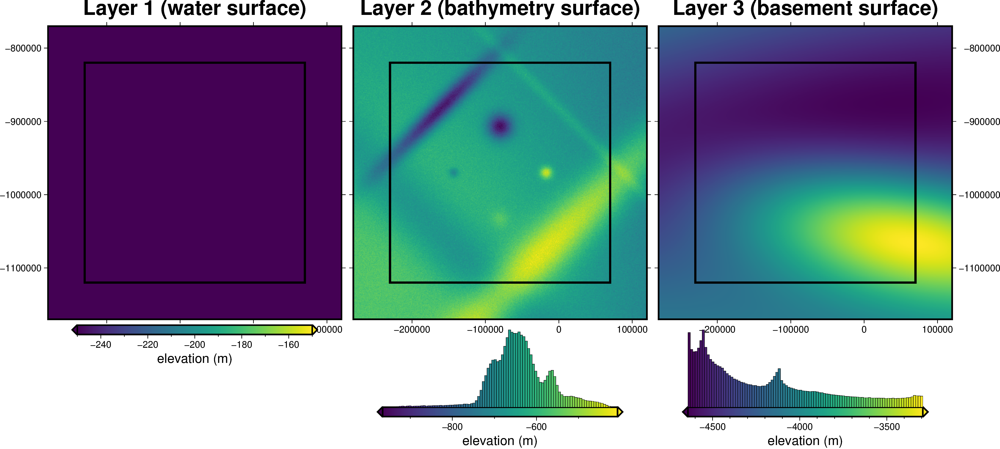

In [20]:
fig = maps.plot_grd(
    layer1,
    fig_height=10,
    title="Layer 1 (water surface)",
    cpt_lims=(-250, -150),
    cbar_label="elevation (m)",
    frame=["nSWe", "xaf100000", "yaf100000"],
    show_region=inversion_region,
)

fig = maps.plot_grd(
    layer2_noise,
    fig_height=10,
    title="Layer 2 (bathymetry surface)",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    cbar_label="elevation (m)",
    frame=["nSwe", "xaf100000", "yaf100000"],
    show_region=inversion_region,
    fig=fig,
    origin_shift="xshift",
)

fig = maps.plot_grd(
    layer3,
    fig_height=10,
    title="Layer 3 (basement surface)",
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    cbar_label="elevation (m)",
    frame=["nSwE", "xaf100000", "yaf100000"],
    show_region=inversion_region,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

### visualize in 3d

In [21]:
# set crs
layer2 = layer2.rio.set_crs("EPSG:3031")

# turn into pyvista mesh
mesh = layer2.pyvista.mesh(x="x", y="y")

# Warp top and plot in 3D
mesh.warp_by_scalar(factor=100,).plot(
    show_edges=False,
)

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

In [22]:
# set crs
layer3 = layer3.rio.set_crs("EPSG:3031")

# turn into pyvista mesh
mesh = layer3.pyvista.mesh(x="x", y="y")

# Warp top and plot in 3D
mesh.warp_by_scalar(factor=100,).plot(
    show_edges=False,
)

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)

### save to .zarr files

In [23]:
# save to zarr files
output = layer1.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/synthetic_layer1.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

output = layer2_noise.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/synthetic_layer2.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

output = layer3.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/synthetic_layer3.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)

### load .zarr files

In [24]:
layer1 = xr.open_zarr("../synthetic_data/synthetic_layer1.zarr").z

layer2 = xr.open_zarr("../synthetic_data/synthetic_layer2.zarr").z

layer3 = xr.open_zarr("../synthetic_data/synthetic_layer3.zarr").z

## Observed gravity
use this synthetic model to create a synthethic gravity survey. This synthetic gravity anomaly will have both regional and short-wavelength signals, from the base layer and bathymetry layer, respectively.

### make a dictionary of properties

In [25]:
layers = {
    "layer1": {
        "spacing": spacing,
        "rho": 1030,
        "grid": layer1,
    },
    "layer2": {
        "spacing": spacing,
        "rho": 2300,
        "grid": layer2,
    },
    "layer3": {
        "spacing": spacing,
        "rho": 2670,
        "grid": layer3,
    },
}

# resample layer grids to match
for k, v in layers.items():
    print(f"\n{'':*<20}Resampling {k} layer {'':*>20}")
    v["grid"] = fetch.resample_grid(
        v["grid"],
        spacing=v["spacing"],
        region=buffer_region,
        registration=registration,
        verbose="q",
    )
    print(utils.get_grid_info(v["grid"]))


********************Resampling layer1 layer ********************
returning original grid
(1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -350.0, -350.0, 'g')

********************Resampling layer2 layer ********************
returning original grid
(1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -965.918212891, -407.173156738, 'g')

********************Resampling layer3 layer ********************
returning original grid
(1000.0, [-280000.0, 120000.0, -1170000.0, -770000.0], -4641.64697266, -3293.51464844, 'g')


### forward gravity of the model

#### make a prism model

********** layer3 top: -4203m and bottom: -4641m **********
********** layer2 top: -639m and bottom: -4203m **********

********** layer1 top: -350m and bottom: -639m **********



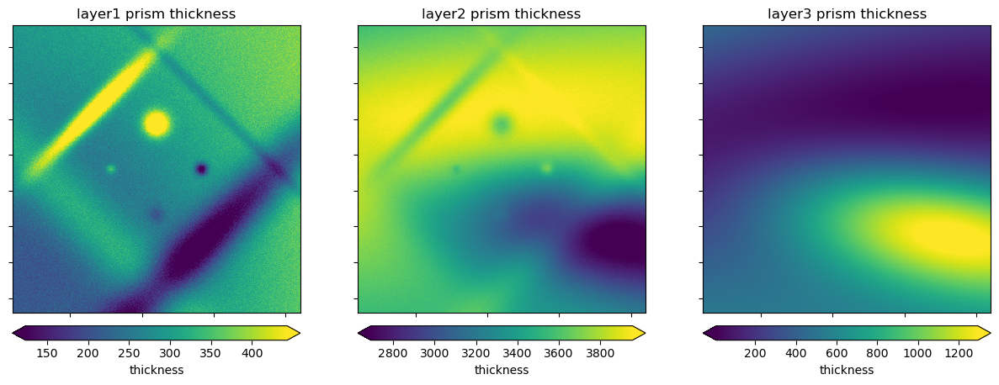

In [26]:
inv.grids_to_prism_layers(
    layers,
    registration="g",
)

plots.plot_prism_layers(
    layers,
    # plot_type='3D',
    # color_by='density',
    color_by="thickness",
    clip_box=False,
    log_scale=False,
    layers_for_3d=["layer2", "layer3"],
)

make pandas dataframe of locations to calculate gravity

In [27]:
synthetic_grav_spacing = spacing
# synthetic_grav_spacing = 10e3
# create lists of coordinates
(x, y) = vd.grid_coordinates(
    region=inversion_region,
    spacing=synthetic_grav_spacing,
    pixel_register=False,
)

# grid the coordinates with a constant height of 1km
observations = vd.make_xarray_grid(
    (x, y),
    np.ones_like(x) * 1e3,
    data_names="z",
    dims=("y", "x"),
).z

# observations = fetch.resample_grid(observations, region=inversion_region, registration=registration)
print(utils.get_grid_info(observations))

df = vd.grid_to_table(observations)

(1000.0, [-230000.0, 70000.0, -1120000.0, -820000.0], 1000.0, 1000.0, 'g')


#### calculate forward gravity of model

In [28]:
synthetic_forward = inv.forward_grav_layers(
    layers,
    df,
    exclude_layers=None,
    progressbar=True,
    parallel=True,
)
synthetic_forward.describe()

  0%|          | 0/90601 [00:00<?, ?it/s]

160801 prisms in layer1 layer
finished layer1 layer


  0%|          | 0/90601 [00:00<?, ?it/s]

160801 prisms in layer2 layer
finished layer2 layer


  0%|          | 0/90601 [00:00<?, ?it/s]

160801 prisms in layer3 layer
finished layer3 layer


,y,x,z,layer1_forward_grav,layer2_forward_grav,layer3_forward_grav,forward_total
count,9.060100e+04,90601.000000,90601.0,9.060100e+04,9.060100e+04,9.060100e+04,9.060100e+04
mean,-9.700000e+05,-80000.000000,1000.0,-1.520827e-15,1.023923e-15,-6.826154e-16,-2.710385e-15
std,8.689122e+04,86891.215513,0.0,2.995996e+00,3.106373e+01,4.090616e+01,8.894581e+00
min,-1.120000e+06,-230000.000000,1000.0,-8.325381e+00,-8.558873e+01,-4.724446e+01,-1.828110e+01
25%,-1.045000e+06,-155000.000000,1000.0,-1.106307e+00,-2.288959e+01,-3.805383e+01,-6.878206e+00
50%,-9.700000e+05,-80000.000000,1000.0,1.531195e-01,7.355189e+00,-8.054605e+00,-5.255462e-01
75%,-8.950000e+05,-5000.000000,1000.0,1.389212e+00,2.727411e+01,3.054936e+01,6.182703e+00
max,-8.200000e+05,70000.000000,1000.0,1.119946e+01,3.998074e+01,9.135567e+01,2.197011e+01


In [31]:
pd.options.plotting.backend = "holoviews"
# synthetic_forward.drop(['x','y','z'], axis=1).plot(kind='hist', alpha=0.5, bins=50)
synthetic_forward.drop(["x", "y", "z"], axis=1).plot(
    kind="hist", subplots=True, width=300, bins=50
).cols(2)

:NdLayout   [Default]
   :Histogram   [forward_total]   (forward_total_count)

#### plot the results

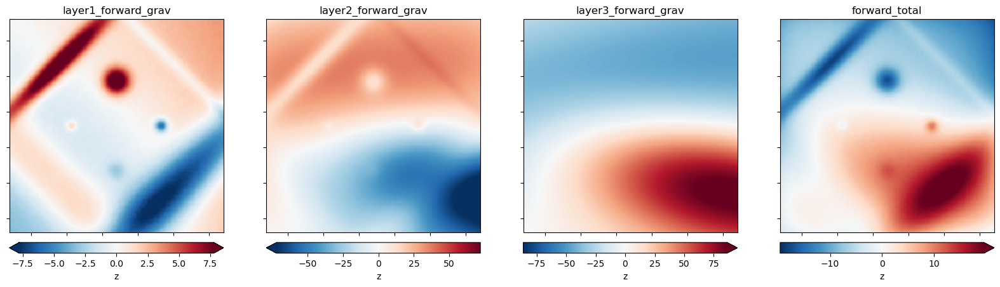

In [29]:
forward_grids = plots.forward_grav_plotting(
    synthetic_forward,
    region=inversion_region,
    grav_spacing=synthetic_grav_spacing,
)

In [30]:
# rename dataarray variables
for k, v in forward_grids.items():
    forward_grids[k] = v.rename(k)

# combine into a dataset
forward_grav = xr.merge(list(forward_grids.values()))

# save to a .zarr file
forward_grav.to_zarr(
    "../synthetic_data/synthetic_forward_grav.zarr",
    mode="w",
)

# load zarr file
forward_grav = xr.open_zarr("../synthetic_data/synthetic_forward_grav.zarr")
forward_grav

<xarray.Dataset>
Dimensions:              (y: 301, x: 301)
Coordinates:
  * x                    (x) float64 -2.3e+05 -2.29e+05 ... 6.9e+04 7e+04
  * y                    (y) float64 -1.12e+06 -1.119e+06 ... -8.21e+05 -8.2e+05
Data variables:
    forward_total        (y, x) float32 dask.array<chunksize=(151, 301), meta=np.ndarray>
    layer1_forward_grav  (y, x) float32 dask.array<chunksize=(151, 301), meta=np.ndarray>
    layer2_forward_grav  (y, x) float32 dask.array<chunksize=(151, 301), meta=np.ndarray>
    layer3_forward_grav  (y, x) float32 dask.array<chunksize=(151, 301), meta=np.ndarray>
Attributes:
    actual_range:  [-8.3253812789917, 11.199460983276367]
    long_name:     z

### add noise

In [32]:
synthetic_forward["grav_noisy"] = synth.contaminate(
    synthetic_forward.forward_total,
    stddev=0.02,
    percent=True,
    seed=0,
)
synthetic_forward.describe()

,y,x,z,layer1_forward_grav,layer2_forward_grav,layer3_forward_grav,forward_total,grav_noisy
count,9.060100e+04,90601.000000,90601.0,9.060100e+04,9.060100e+04,9.060100e+04,9.060100e+04,9.060100e+04
mean,-9.700000e+05,-80000.000000,1000.0,-1.520827e-15,1.023923e-15,-6.826154e-16,-2.710385e-15,-1.184539e-15
std,8.689122e+04,86891.215513,0.0,2.995996e+00,3.106373e+01,4.090616e+01,8.894581e+00,8.904098e+00
min,-1.120000e+06,-230000.000000,1000.0,-8.325381e+00,-8.558873e+01,-4.724446e+01,-1.828110e+01,-1.924124e+01
25%,-1.045000e+06,-155000.000000,1000.0,-1.106307e+00,-2.288959e+01,-3.805383e+01,-6.878206e+00,-6.913328e+00
50%,-9.700000e+05,-80000.000000,1000.0,1.531195e-01,7.355189e+00,-8.054605e+00,-5.255462e-01,-5.534923e-01
75%,-8.950000e+05,-5000.000000,1000.0,1.389212e+00,2.727411e+01,3.054936e+01,6.182703e+00,6.187568e+00
max,-8.200000e+05,70000.000000,1000.0,1.119946e+01,3.998074e+01,9.135567e+01,2.197011e+01,2.306794e+01


compare with and without noise

returning original grid
returning original grid


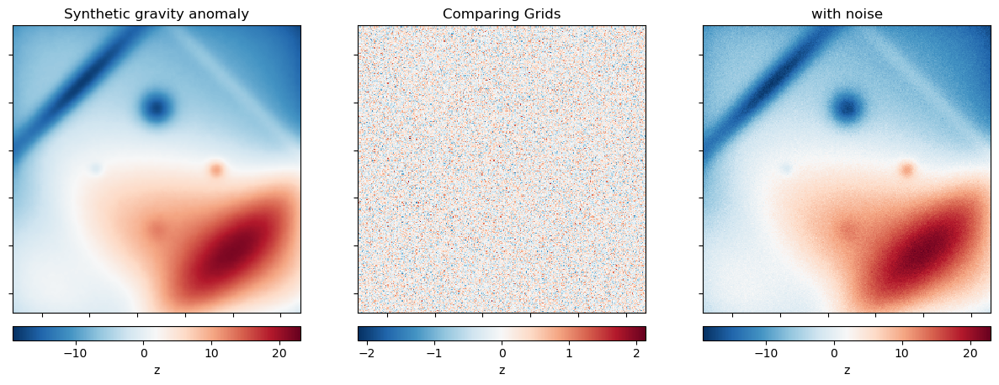

In [33]:
grav_noise_free = synthetic_forward.set_index(["y", "x"]).to_xarray().forward_total
grav_noisy = synthetic_forward.set_index(["y", "x"]).to_xarray().grav_noisy

grids = utils.grd_compare(
    grav_noise_free,
    grav_noisy,
    plot=True,
    region=inversion_region,
    plot_type="xarray",
    cmap="RdBu_r",
    grid1_name="Synthetic gravity anomaly",
    grid2_name="with noise",
    show_region=inversion_region,
)

### create observation points

In [90]:
obs_grav_spacing = 1e3

# regular grid
# coords = vd.grid_coordinates(
#     region=inversion_region,
#     spacing=obs_grav_spacing,
#     pixel_register=False,
#     )

# # turn coordinates into dataarray
# grav = vd.make_xarray_grid(
#     coords, data=np.ones_like(coords[0]) * 1e3, data_names="z", dims=("y", "x")
# )
# turn dataarray into dataframe
# df = vd.grid_to_table(grav)
# df

# irregular grid
# offset so doesn't line up with anomalies
offset = 7e3
# simulate N-S tie lines
x = np.arange(inversion_region[0] + offset, inversion_region[1], 50e3)
y = np.arange(inversion_region[2], inversion_region[3], obs_grav_spacing)
# remove the 3rd N-S line
x = np.delete(x, 2)

coords = np.meshgrid(x, y)
# turn coordinates into dataarray
ties = vd.make_xarray_grid(
    coords, data=np.ones_like(coords[0]) * 1e3, data_names="z", dims=("y", "x")
)
# turn dataarray into dataframe
df_ties = vd.grid_to_table(ties)

# simulate E-W flight lines
x = np.arange(inversion_region[0], inversion_region[1], obs_grav_spacing)
y = np.arange(inversion_region[2] + offset, inversion_region[3], 15e3)
# remove a few E-W lines, starting from bottom
y = np.delete(y, [3, 8, 17])

coords = np.meshgrid(x, y)
# turn coordinates into dataarray
lines = vd.make_xarray_grid(
    coords, data=np.ones_like(coords[0]) * 1e3, data_names="z", dims=("y", "x")
)
# turn dataarray into dataframe
df_lines = vd.grid_to_table(lines)

# merge dataframes
df = pd.concat([df_ties, df_lines])
df

,y,x,z
0,-1120000.0,-223000.0,1000.0
1,-1120000.0,-173000.0,1000.0
2,-1120000.0,-73000.0,1000.0
3,-1120000.0,-23000.0,1000.0
4,-1120000.0,27000.0,1000.0
...,...,...,...
5095,-828000.0,65000.0,1000.0
5096,-828000.0,66000.0,1000.0
5097,-828000.0,67000.0,1000.0
5098,-828000.0,68000.0,1000.0


### sample grid

In [91]:
# grid the synthetic gravity data
synthetic_gravity = synthetic_forward.set_index(["y", "x"]).to_xarray().grav_noisy

# sample the noisy data at the observation points
grav = profile.sample_grids(df, synthetic_gravity, "Gobs")
grav

,y,x,z,Gobs
0,-1120000.0,-223000.0,1000.0,-2.728498
1,-1120000.0,-173000.0,1000.0,-0.336524
2,-1120000.0,-73000.0,1000.0,6.734009
3,-1120000.0,-23000.0,1000.0,6.658800
4,-1120000.0,27000.0,1000.0,1.833201
...,...,...,...,...
5095,-828000.0,65000.0,1000.0,-16.875521
5096,-828000.0,66000.0,1000.0,-16.180449
5097,-828000.0,67000.0,1000.0,-16.311317
5098,-828000.0,68000.0,1000.0,-16.591862


grid the sampled points

In [92]:
Gobs = pygmt.surface(
    data=grav[["x", "y", "Gobs"]],
    region=inversion_region,
    spacing=obs_grav_spacing,
    registration=registration,
    T=0.25,
    verbose="q",
)

plot synthetic gravity anomaly

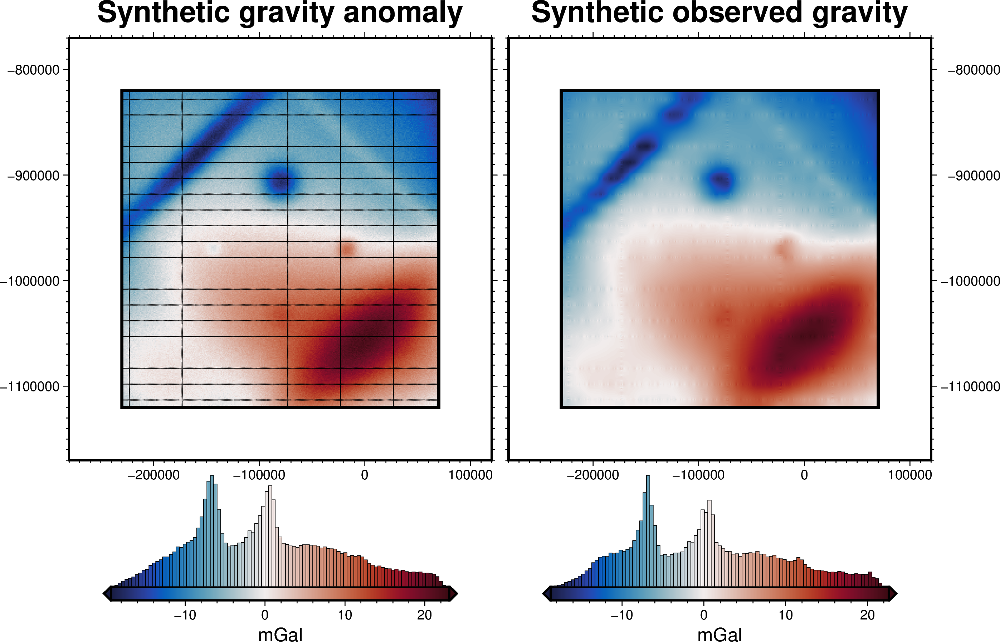

In [94]:
# plot the synthetic gravity anomaly grid
fig = maps.plot_grd(
    synthetic_gravity,
    region=buffer_region,
    fig_height=10,
    cmap="balance+h0",
    title="Synthetic gravity anomaly",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
)

# plot observation points
fig.plot(grav[["x", "y"]], style="c.02c", color="black")

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    Gobs,
    region=buffer_region,
    fig_height=10,
    cmap="balance+h0",
    title="Synthetic observed gravity",
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

## save to a csv
re-format the dataframe

In [95]:
grav.rename(
    columns={
        "z": "ellipsoidal_elevation",
        "Gobs": "free_air_anomaly",
    },
    inplace=True,
)
grav

,y,x,ellipsoidal_elevation,free_air_anomaly
0,-1120000.0,-223000.0,1000.0,-2.728498
1,-1120000.0,-173000.0,1000.0,-0.336524
2,-1120000.0,-73000.0,1000.0,6.734009
3,-1120000.0,-23000.0,1000.0,6.658800
4,-1120000.0,27000.0,1000.0,1.833201
...,...,...,...,...
5095,-828000.0,65000.0,1000.0,-16.875521
5096,-828000.0,66000.0,1000.0,-16.180449
5097,-828000.0,67000.0,1000.0,-16.311317
5098,-828000.0,68000.0,1000.0,-16.591862


In [96]:
grav["lat"] = np.nan
grav["lon"] = np.nan
grav["station_ID"] = np.nan
grav["geoidal_elevation"] = np.nan
grav["elevation_error"] = np.nan
grav["observed_gravity"] = np.nan
grav["observed_gravity_error"] = np.nan
grav["gravity_disturbance"] = np.nan
grav["gravity_disturbance_error"] = np.nan
grav["free_air_anomaly_error"] = np.nan

In [97]:
grav = grav[
    [
        "x",
        "y",
        "lat",
        "lon",
        "station_ID",
        "ellipsoidal_elevation",
        "geoidal_elevation",
        "elevation_error",
        "observed_gravity",
        "observed_gravity_error",
        "gravity_disturbance",
        "gravity_disturbance_error",
        "free_air_anomaly",
        "free_air_anomaly_error",
    ]
]
grav

,x,y,lat,lon,station_ID,ellipsoidal_elevation,geoidal_elevation,elevation_error,observed_gravity,observed_gravity_error,gravity_disturbance,gravity_disturbance_error,free_air_anomaly,free_air_anomaly_error
0,-223000.0,-1120000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-2.728498,NaN
1,-173000.0,-1120000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.336524,NaN
2,-73000.0,-1120000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,6.734009,NaN
3,-23000.0,-1120000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,6.658800,NaN
4,27000.0,-1120000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,1.833201,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5095,65000.0,-828000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-16.875521,NaN
5096,66000.0,-828000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-16.180449,NaN
5097,67000.0,-828000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-16.311317,NaN
5098,68000.0,-828000.0,NaN,NaN,NaN,1000.0,NaN,NaN,NaN,NaN,NaN,NaN,-16.591862,NaN


In [98]:
grav.to_csv(
    "../synthetic_data/synthetic_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

## create random constraint points

In [99]:
coords = vd.scatter_points(region=inversion_region, size=33, random_state=1)
constraint_points = pd.DataFrame(data={"x": coords[0], "y": coords[1]})

In [100]:
constraint_points.to_csv(
    "../synthetic_data/synthetic_constraints.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

## create starting bathymetry layer

returning original grid
returning original grid


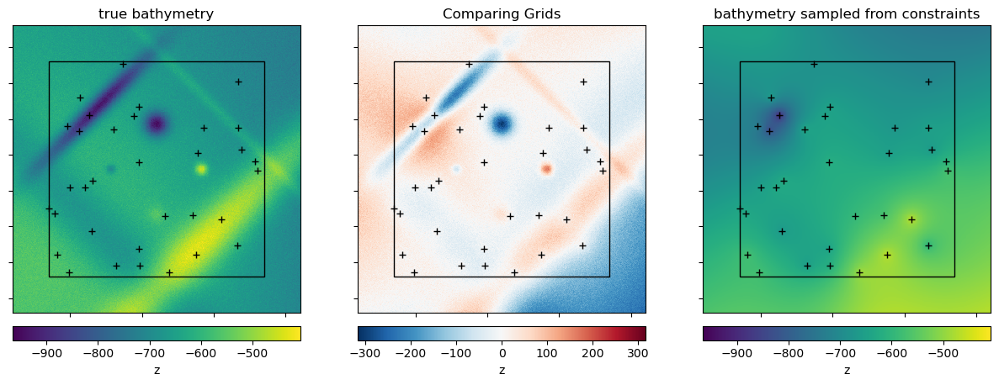

In [103]:
df = constraint_points.copy()
df = profile.sample_grids(df, layer2, "z")
starting_bathymetry = pygmt.surface(
    data=df,
    region=buffer_region,
    spacing=obs_grav_spacing,
    registration=registration,
    T=0.35,
    verbose="q",
)

# compare starting and actual bathymetry grids
grids = utils.grd_compare(
    layer2,
    starting_bathymetry,
    plot=True,
    plot_type="xarray",
    grid1_name="true bathymetry",
    grid2_name="bathymetry sampled from constraints",
    points=df,
    show_region=inversion_region,
)

## save inputs as .zarr files

In [104]:
output = starting_bathymetry.to_dataset(name="z")
output.to_zarr(
    "../synthetic_data/synthetic_starting_bathymetry.zarr",
    encoding={"z": {"compressor": zarr.Blosc()}},
    mode="w",
)